In [1]:
"""
Created on 30/12/2024

@author: federica montana

This file is used to generate geographical plots for visualizing 
1. clusters
2. indicators 
3. domains

"""
# Import packages
import pandas as pd
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas
from matplotlib.colors import Normalize

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from scipy.ndimage import label
import re
from unidecode import unidecode
from scipy import stats
from scipy.stats import norm
import joblib
from statsmodels.stats.diagnostic import lilliefors
import seaborn as sns
import contextily as ctx
from matplotlib.lines import Line2D
from utility import clusters, domains, indicators, statistics, dom_ind_dict
import matplotlib.lines as mlines
from matplotlib_scalebar.scalebar import ScaleBar

Geodata plots

In [2]:
df_city = pd.read_csv('results\\indicators\\data1.csv')


In [3]:
# Include geometry
b = gpd.read_file('DATA\\data\\all_cities.shp') 
b = b.to_crs('EPSG:3035')
b['centroid'] = b.geometry.centroid

In [4]:
# Add a color legend for each subplot
# Define score categories
score_categories = {
    'Poor': (0, 3),
    'Moderate': (3, 6),
    'Good': (6, 9),
    'Perfect': (9, 10)
}

In [5]:

# Example dictionary defining cluster categories and marker sizes
cluster_dict = {
    'large metropolitan': {'markersize': 700},
    'metropolitan':       {'markersize': 500},
    'medium':             {'markersize': 200},
    'small':              {'markersize': 100},
    'small towns':         {'markersize': 50}
}

In [6]:
pivot_df_indicator = pd.read_csv(f'results\\df_rank_rescaled_city.csv')
pivot_df_indicator = pivot_df_indicator.copy()
gdf_pivot = pd.merge(pivot_df_indicator, b[['urau_code', 'centroid']], on='urau_code', how='inner')
gdf_pivot2 = gpd.GeoDataFrame(gdf_pivot, geometry = gdf_pivot['centroid'])
gdf_plot_qgis = gpd.GeoDataFrame(gdf_pivot2, geometry=gdf_pivot2['centroid'], crs=gdf_pivot2.crs)
gdf_plot_qgis = gdf_plot_qgis.set_geometry('centroid').drop(columns=['geometry'], errors='ignore')
for column in gdf_plot_qgis.select_dtypes(include='category').columns:
    gdf_plot_qgis[column] = gdf_plot_qgis[column].astype(str)

gdf_centroids = gdf_plot_qgis.copy()

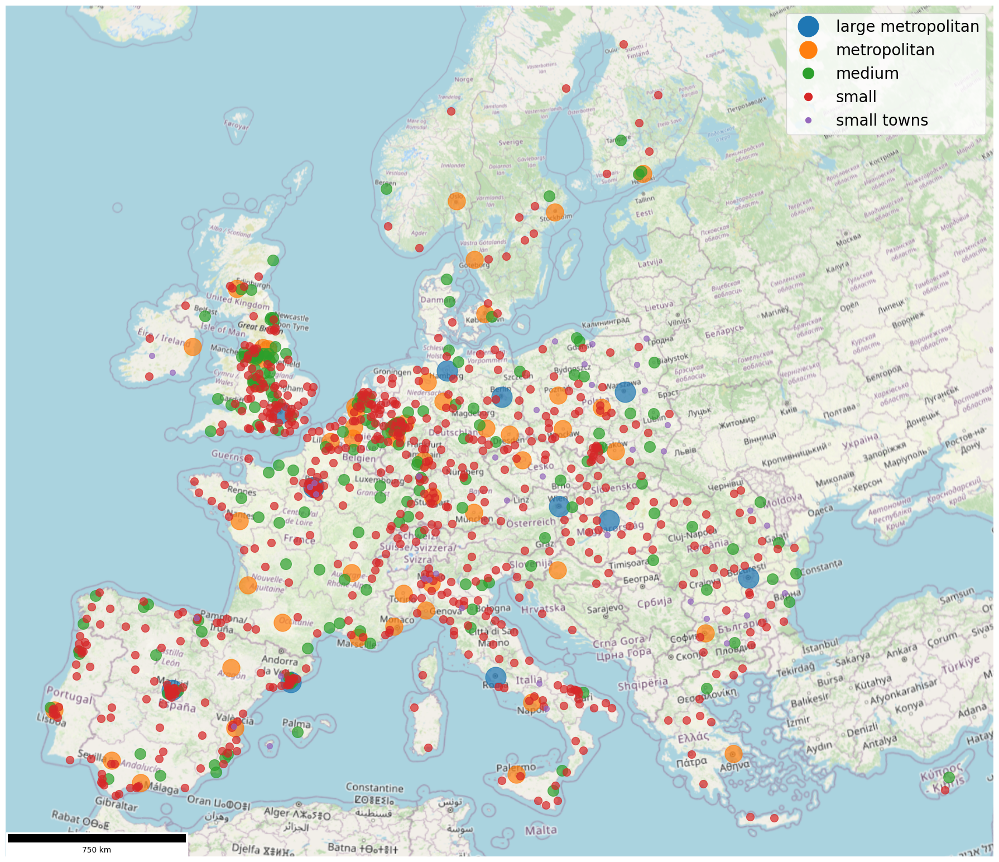

In [7]:
# Example cluster definitions: color + marker size
# Adjust the marker sizes until they look correct on your map.
cluster_properties = {
    'large metropolitan': {'color': '#1f77b4', 'markersize': 700},
    'metropolitan':       {'color': '#ff7f0e', 'markersize': 500},
    'medium':             {'color': '#2ca02c', 'markersize': 200},
    'small':              {'color': '#d62728', 'markersize': 100},
    'small towns':        {'color': '#9467bd', 'markersize': 50}
}

# Assuming gdf_centroids is your GeoDataFrame
# with a column called 'cluster' that holds the cluster category:
# 'large metropolitan', 'metropolitan', 'medium', 'small', 'small towns', etc.

fig, ax = plt.subplots(1, 1, figsize=(18, 16))

# Plot each cluster separately with the desired color and point size
for cluster, props in cluster_properties.items():
    subset = gdf_centroids[gdf_centroids['cluster'] == cluster]
    
    # Plot the subset
    subset.plot(
        ax=ax,
        marker='o',
        color=props['color'],
        markersize=props['markersize'],  # controlling the point size
        alpha=0.7
    )

# Build a custom legend to show both color and approximate size
legend_elements = []
for cluster, props in cluster_properties.items():
    # In the legend, "markersize" corresponds roughly to sqrt of the area.
    # If your points appear too big/small in the legend,
    # tweak the sqrt factor or use a direct numeric approach.
    legend_elements.append(
        Line2D(
            [0], [0],
            marker='o',
            color=props['color'],
            label=cluster,
            markersize=np.sqrt(props['markersize']),  # approximate
            linewidth=0
        )
    )

ax.legend(
    handles=legend_elements,
    loc='upper right',
    fontsize=20
)

# Hide axis boundaries
ax.set_title('')
ax.axis('off')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik,
    crs=gdf_centroids.crs  # Ensure it matches your GeoDataFrame's CRS
)

# Add a scale bar
scalebar = ScaleBar(
    dx=1,
    units="m",
    dimension="si-length",
    scale_loc="bottom",
    location="lower left"
)
ax.add_artist(scalebar)

plt.tight_layout()
plt.savefig('plots\\maps_geo.png', bbox_inches='tight', pad_inches=0)

plt.show()


Urban design

In [8]:
pivot_df_indicator = pd.read_csv(f'results\\df_rank_rescaled_city.csv')
pivot_df_indicator = pivot_df_indicator.copy()
gdf_pivot = pd.merge(pivot_df_indicator, b[['urau_code', 'centroid']], on='urau_code', how='inner')
gdf_pivot2 = gpd.GeoDataFrame(gdf_pivot, geometry = gdf_pivot['centroid'])
gdf_plot_qgis = gpd.GeoDataFrame(gdf_pivot2, geometry=gdf_pivot2['centroid'], crs=gdf_pivot2.crs)
gdf_plot_qgis = gdf_plot_qgis.set_geometry('centroid').drop(columns=['geometry'], errors='ignore')
for column in gdf_plot_qgis.select_dtypes(include='category').columns:
    gdf_plot_qgis[column] = gdf_plot_qgis[column].astype(str)

gdf_centroids = gdf_plot_qgis.copy()

C:\Users\fmontana\AppData\Local\Temp\ipykernel_26032\3442216809.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(shared_cmap)


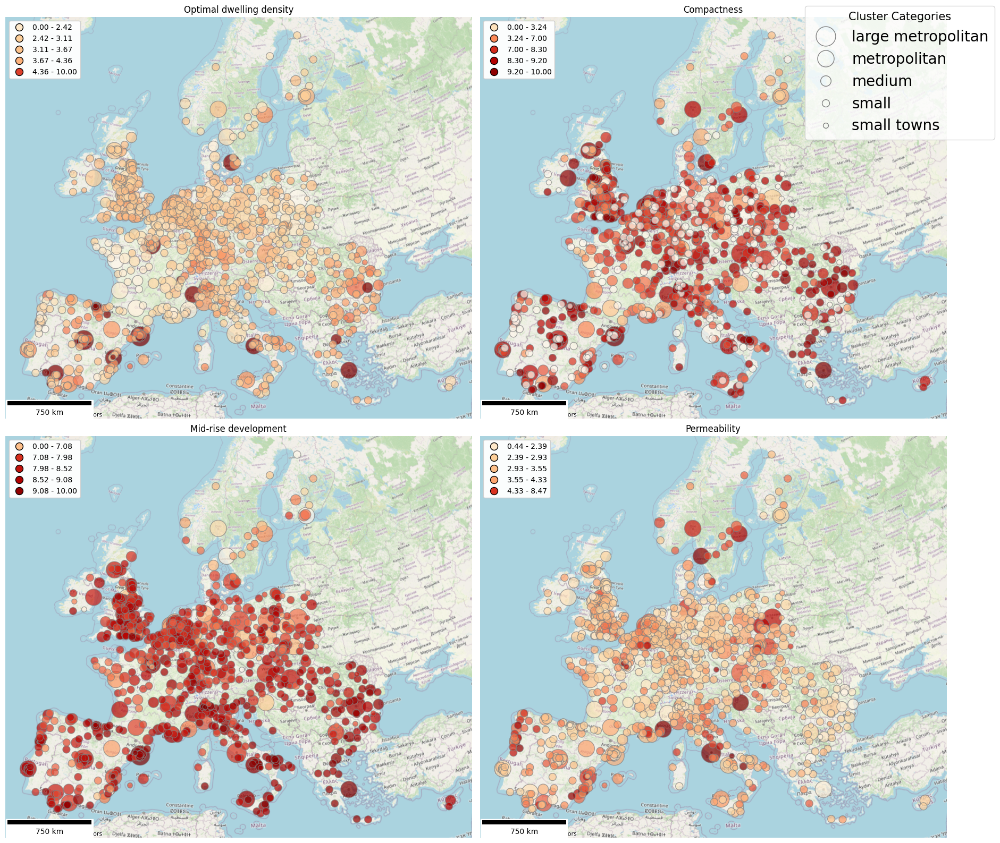

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.flatten()

# Let's say you have 4 indicators
indicator_titles = indicators[:4]
shared_cmap = 'OrRd'  # optional if you want to color by the indicator
cmap = plt.cm.get_cmap(shared_cmap)

for ax, indicator in zip(axes, indicator_titles):
    # Plot each cluster in the same subplot
    quintiles = np.percentile(gdf_centroids[indicator].dropna(), [0, 20, 40, 60, 80, 100])

    # Normalize based on the full range
    norm = Normalize(vmin=quintiles[0], vmax=quintiles[-1])
    
    # Create a custom legend based on quintiles
    color_legend = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='none',
            markerfacecolor=cmap(norm((quintiles[i] + quintiles[i + 1]) / 2)),
            markersize=10,
            label=f"{quintiles[i]:.2f} - {quintiles[i + 1]:.2f}"
        ) for i in range(len(quintiles) - 1)
    ]
    for cluster_name, props in cluster_dict.items():
        subset = gdf_centroids[gdf_centroids['cluster'] == cluster_name]

        # Plot each cluster category as a ring
        # If you want them fully grey, remove `column=indicator, cmap=...`
        subset.plot(
            ax=ax,
            column=indicator,         # remove if you do NOT want to color by an indicator
            cmap=shared_cmap,         # remove if you do NOT want to color by an indicator
            markersize=props['markersize'],
            facecolor='none',         # no fill, just ring
            edgecolor='grey',
            alpha=0.7,
            legend=False
        )

    ax.set_title(indicator)
    ax.axis('off')
    
    # Add the quintile-based legend to the subplot
    legend = ax.legend(
        handles=color_legend,
        #title=title,
        loc='upper left',
        fontsize='medium',
        frameon=True
    )
    ax.add_artist(legend)

# ---------- Create a SINGLE cluster-category legend --------------
# Use the same dictionary so sizes match the rings in the map
legend_handles = []
for cluster_name, props in cluster_dict.items():
    legend_handles.append(
        Line2D(
            [0], [0],
            marker='o',
            color='grey',           # ring color
            markerfacecolor='none', # hollow
            markersize=np.sqrt(props['markersize']),  # approximate
            linewidth=0,
            label=cluster_name
        )
    )

# We add the legend to the *figure*, so it only appears once
fig.legend(
    handles=legend_handles,
    title='Cluster Categories',
    loc='upper right',
    bbox_to_anchor=(1.05, 1),  # Fine-tune position
    fontsize=20,
    title_fontsize=15
)

# ---------- Add basemap + scalebar to each subplot --------------
for ax in axes:
    ctx.add_basemap(
        ax,
        source=ctx.providers.OpenStreetMap.Mapnik,
        crs=gdf_centroids.crs
    )
    scalebar = ScaleBar(
        dx=1,
        units='m',
        dimension='si-length',
        scale_loc='bottom',
        location='lower left'
    )
    ax.add_artist(scalebar)

plt.tight_layout()
plt.savefig('plots\\indicators\\geo\\eu_ud.png', dpi=300, bbox_inches='tight')

plt.show()


Sustainable transportation

C:\Users\fmontana\AppData\Local\Temp\ipykernel_26032\3540061045.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(shared_cmap)


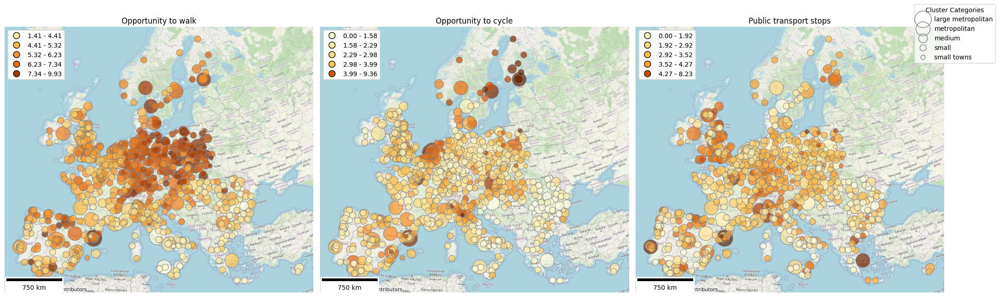

In [10]:
# Create the plot with three subplots
fig, axes = plt.subplots(1, 3, figsize=(21, 7))
shared_cmap = 'YlOrBr'
indicator_titles = indicators[4:7]

cmap = plt.cm.get_cmap(shared_cmap)

for ax, indicator in zip(axes, indicator_titles):
    # Plot each cluster in the same subplot
    quintiles = np.percentile(gdf_centroids[indicator].dropna(), [0, 20, 40, 60, 80, 100])

    # Normalize based on the full range
    norm = Normalize(vmin=quintiles[0], vmax=quintiles[-1])
    
    # Create a custom legend based on quintiles
    color_legend = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='none',
            markerfacecolor=cmap(norm((quintiles[i] + quintiles[i + 1]) / 2)),
            markersize=10,
            label=f"{quintiles[i]:.2f} - {quintiles[i + 1]:.2f}"
        ) for i in range(len(quintiles) - 1)
    ]
    for cluster_name, props in cluster_dict.items():
        subset = gdf_centroids[gdf_centroids['cluster'] == cluster_name]

        # Plot each cluster category as a ring
        # If you want them fully grey, remove `column=indicator, cmap=...`
        subset.plot(
            ax=ax,
            column=indicator,         # remove if you do NOT want to color by an indicator
            cmap=shared_cmap,         # remove if you do NOT want to color by an indicator
            markersize=props['markersize'],
            facecolor='none',         # no fill, just ring
            edgecolor='grey',
            alpha=0.7,
            legend=False
        )

    ax.set_title(indicator)
    ax.axis('off')
    
    # Add the quintile-based legend to the subplot
    legend = ax.legend(
        handles=color_legend,
        #title=title,
        loc='upper left',
        fontsize='medium',
        frameon=True
    )
    ax.add_artist(legend)

# ---------- Create a SINGLE cluster-category legend --------------
# Use the same dictionary so sizes match the rings in the map
legend_handles = []
for cluster_name, props in cluster_dict.items():
    legend_handles.append(
        Line2D(
            [0], [0],
            marker='o',
            color='grey',           # ring color
            markerfacecolor='none', # hollow
            markersize=np.sqrt(props['markersize']),  # approximate
            linewidth=0,
            label=cluster_name
        )
    )

# We add the legend to the *figure*, so it only appears once
fig.legend(
    handles=legend_handles,
    title='Cluster Categories',
    loc='upper right',
    bbox_to_anchor=(1.05, 1),  # Fine-tune position
    fontsize=10,
    title_fontsize=10
)

# ---------- Add basemap + scalebar to each subplot --------------
for ax in axes:
    ctx.add_basemap(
        ax,
        source=ctx.providers.OpenStreetMap.Mapnik,
        crs=gdf_centroids.crs
    )
    scalebar = ScaleBar(
        dx=1,
        units='m',
        dimension='si-length',
        scale_loc='bottom',
        location='lower left'
    )
    ax.add_artist(scalebar)

plt.tight_layout()
plt.savefig('plots\\indicators\\geo\\eu_st.png', dpi=300, bbox_inches='tight')

plt.show()


Environmental quality

C:\Users\fmontana\AppData\Local\Temp\ipykernel_26032\4116443247.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(shared_cmap)


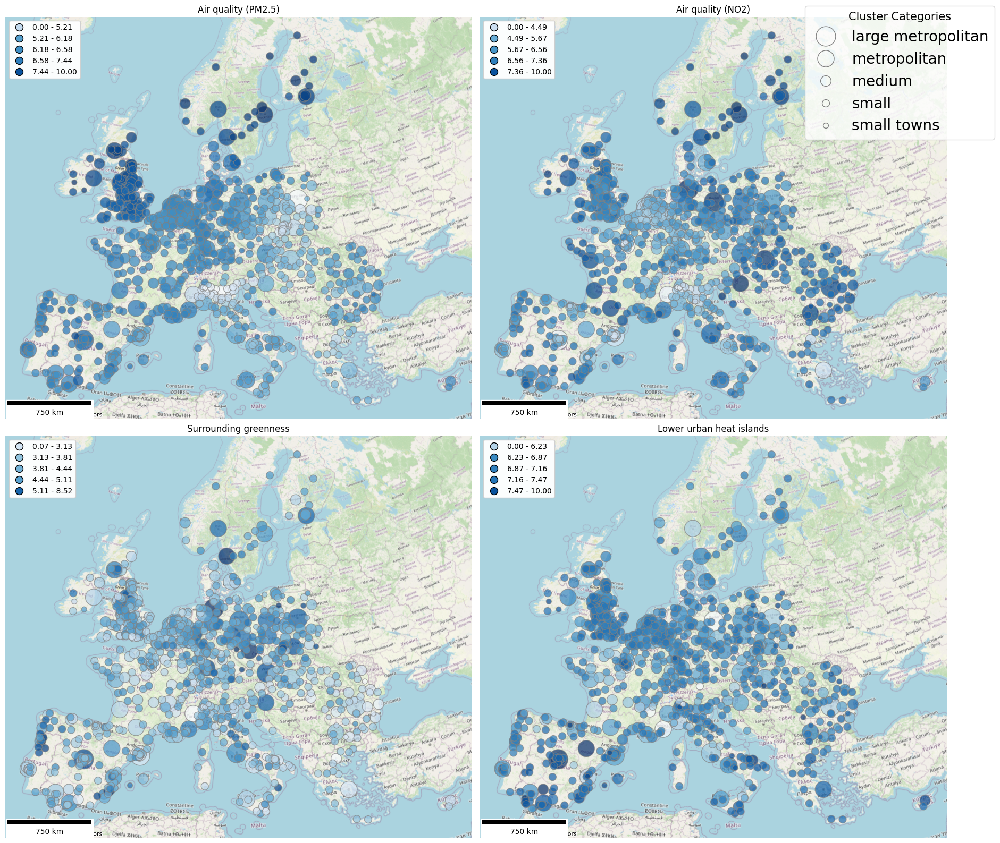

In [11]:
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.flatten()

# Let's say you have 4 indicators
indicator_titles = indicators[7:11]
shared_cmap = 'Blues'  # optional if you want to color by the indicator

cmap = plt.cm.get_cmap(shared_cmap)

for ax, indicator in zip(axes, indicator_titles):
    # Plot each cluster in the same subplot
    quintiles = np.percentile(gdf_centroids[indicator].dropna(), [0, 20, 40, 60, 80, 100])

    # Normalize based on the full range
    norm = Normalize(vmin=quintiles[0], vmax=quintiles[-1])
    
    # Create a custom legend based on quintiles
    color_legend = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='none',
            markerfacecolor=cmap(norm((quintiles[i] + quintiles[i + 1]) / 2)),
            markersize=10,
            label=f"{quintiles[i]:.2f} - {quintiles[i + 1]:.2f}"
        ) for i in range(len(quintiles) - 1)
    ]
    for cluster_name, props in cluster_dict.items():
        subset = gdf_centroids[gdf_centroids['cluster'] == cluster_name]

        # Plot each cluster category as a ring
        # If you want them fully grey, remove `column=indicator, cmap=...`
        subset.plot(
            ax=ax,
            column=indicator,         # remove if you do NOT want to color by an indicator
            cmap=shared_cmap,         # remove if you do NOT want to color by an indicator
            markersize=props['markersize'],
            facecolor='none',         # no fill, just ring
            edgecolor='grey',
            alpha=0.7,
            legend=False
        )

    ax.set_title(indicator)
    ax.axis('off')
    
    # Add the quintile-based legend to the subplot
    legend = ax.legend(
        handles=color_legend,
        #title=title,
        loc='upper left',
        fontsize='medium',
        frameon=True
    )
    ax.add_artist(legend)

# ---------- Create a SINGLE cluster-category legend --------------
# Use the same dictionary so sizes match the rings in the map
legend_handles = []
for cluster_name, props in cluster_dict.items():
    legend_handles.append(
        Line2D(
            [0], [0],
            marker='o',
            color='grey',           # ring color
            markerfacecolor='none', # hollow
            markersize=np.sqrt(props['markersize']),  # approximate
            linewidth=0,
            label=cluster_name
        )
    )

# We add the legend to the *figure*, so it only appears once
fig.legend(
    handles=legend_handles,
    title='Cluster Categories',
    loc='upper right',
    bbox_to_anchor=(1.05, 1),  # Fine-tune position
    fontsize=20,
    title_fontsize=15
)

# ---------- Add basemap + scalebar to each subplot --------------
for ax in axes:
    ctx.add_basemap(
        ax,
        source=ctx.providers.OpenStreetMap.Mapnik,
        crs=gdf_centroids.crs
    )
    scalebar = ScaleBar(
        dx=1,
        units='m',
        dimension='si-length',
        scale_loc='bottom',
        location='lower left'
    )
    ax.add_artist(scalebar)

plt.tight_layout()
plt.savefig('plots\\indicators\\geo\\eu_eq.png', dpi=300, bbox_inches='tight')

plt.show()


Green Spaces Accessibility

C:\Users\fmontana\AppData\Local\Temp\ipykernel_26032\782435839.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(shared_cmap)


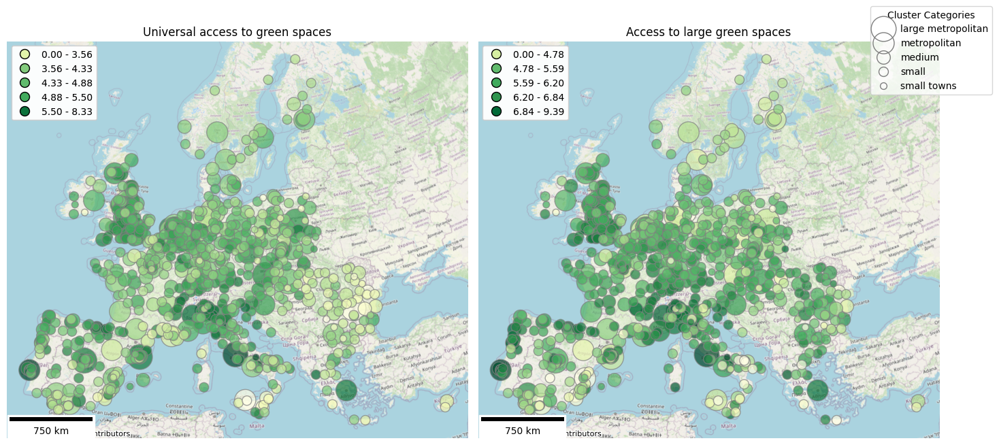

In [12]:
# Create the plot with three subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
shared_cmap = 'YlGn'
indicator_titles = indicators[11:13]
axes = axes.flatten()

cmap = plt.cm.get_cmap(shared_cmap)

for ax, indicator in zip(axes, indicator_titles):
    # Plot each cluster in the same subplot
    quintiles = np.percentile(gdf_centroids[indicator].dropna(), [0, 20, 40, 60, 80, 100])

    # Normalize based on the full range
    norm = Normalize(vmin=quintiles[0], vmax=quintiles[-1])
    
    # Create a custom legend based on quintiles
    color_legend = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='none',
            markerfacecolor=cmap(norm((quintiles[i] + quintiles[i + 1]) / 2)),
            markersize=10,
            label=f"{quintiles[i]:.2f} - {quintiles[i + 1]:.2f}"
        ) for i in range(len(quintiles) - 1)
    ]
    for cluster_name, props in cluster_dict.items():
        subset = gdf_centroids[gdf_centroids['cluster'] == cluster_name]

        # Plot each cluster category as a ring
        # If you want them fully grey, remove `column=indicator, cmap=...`
        subset.plot(
            ax=ax,
            column=indicator,         # remove if you do NOT want to color by an indicator
            cmap=shared_cmap,         # remove if you do NOT want to color by an indicator
            markersize=props['markersize'],
            facecolor='none',         # no fill, just ring
            edgecolor='grey',
            alpha=0.7,
            legend=False
        )

    ax.set_title(indicator)
    ax.axis('off')
    
    # Add the quintile-based legend to the subplot
    legend = ax.legend(
        handles=color_legend,
        #title=title,
        loc='upper left',
        fontsize='medium',
        frameon=True
    )
    ax.add_artist(legend)

# ---------- Create a SINGLE cluster-category legend --------------
# Use the same dictionary so sizes match the rings in the map
legend_handles = []
for cluster_name, props in cluster_dict.items():
    legend_handles.append(
        Line2D(
            [0], [0],
            marker='o',
            color='grey',           # ring color
            markerfacecolor='none', # hollow
            markersize=np.sqrt(props['markersize']),  # approximate
            linewidth=0,
            label=cluster_name
        )
    )

# We add the legend to the *figure*, so it only appears once
fig.legend(
    handles=legend_handles,
    title='Cluster Categories',
    loc='upper right',
    bbox_to_anchor=(1.05, 1),  # Fine-tune position
    fontsize=10,
    title_fontsize=10
)

# ---------- Add basemap + scalebar to each subplot --------------
for ax in axes:
    ctx.add_basemap(
        ax,
        source=ctx.providers.OpenStreetMap.Mapnik,
        crs=gdf_centroids.crs
    )
    scalebar = ScaleBar(
        dx=1,
        units='m',
        dimension='si-length',
        scale_loc='bottom',
        location='lower left'
    )
    ax.add_artist(scalebar)
plt.tight_layout()
plt.savefig('plots\\indicators\\geo\\eu_gs.png', dpi=300, bbox_inches='tight')

plt.show()


Domain

In [21]:
# Read the CSV file into a DataFrame
df = pd.read_csv(f'results\\df_rank_domain.csv')

# Create a copy of the DataFrame
df2 = df.copy()

# Merge the DataFrame with the GeoDataFrame 'b' on 'urau_code' and include the 'centroid' column
gdf_pivot = pd.merge(df2, b[['urau_code', 'centroid']], on='urau_code', how='inner')

# Convert the merged DataFrame to a GeoDataFrame
gdf_pivot2 = gpd.GeoDataFrame(gdf_pivot, geometry=gdf_pivot['centroid'])

# Create another GeoDataFrame with the same geometry and CRS
gdf_plot_qgis = gpd.GeoDataFrame(gdf_pivot2, geometry=gdf_pivot2['centroid'], crs=gdf_pivot2.crs)

# Set the geometry to 'centroid' and drop any existing 'geometry' column
gdf_plot_qgis = gdf_plot_qgis.set_geometry('centroid').drop(columns=['geometry'], errors='ignore')

# Convert categorical columns to string type
for column in gdf_plot_qgis.select_dtypes(include='category').columns:
    gdf_plot_qgis[column] = gdf_plot_qgis[column].astype(str)

# Save the GeoDataFrame to a shapefile
gdf_plot_qgis.to_file('results\\qgis_domain.shp')

C:\Users\fmontana\AppData\Local\Temp\ipykernel_26032\2550225720.py:24: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_plot_qgis.to_file('results\\qgis_domain.shp')
C:\Users\fmontana\AppData\Roaming\Python\Python39\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Unnamed: 0' to 'Unnamed_ 0'
  ogr_write(
C:\Users\fmontana\AppData\Roaming\Python\Python39\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Environmental Quality' to 'Environmen'
  ogr_write(
C:\Users\fmontana\AppData\Roaming\Python\Python39\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Green Spaces Accessibility' to 'Green Spac'
  ogr_write(
C:\Users\fmontana\AppData\Roaming\Python\Python39\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Sustainable Transportation' to 'Sustainabl'
  ogr_write(
C:\Users\fmontana\AppData\Roaming\

C:\Users\fmontana\AppData\Local\Temp\ipykernel_26032\3276038243.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(shared_cmap)


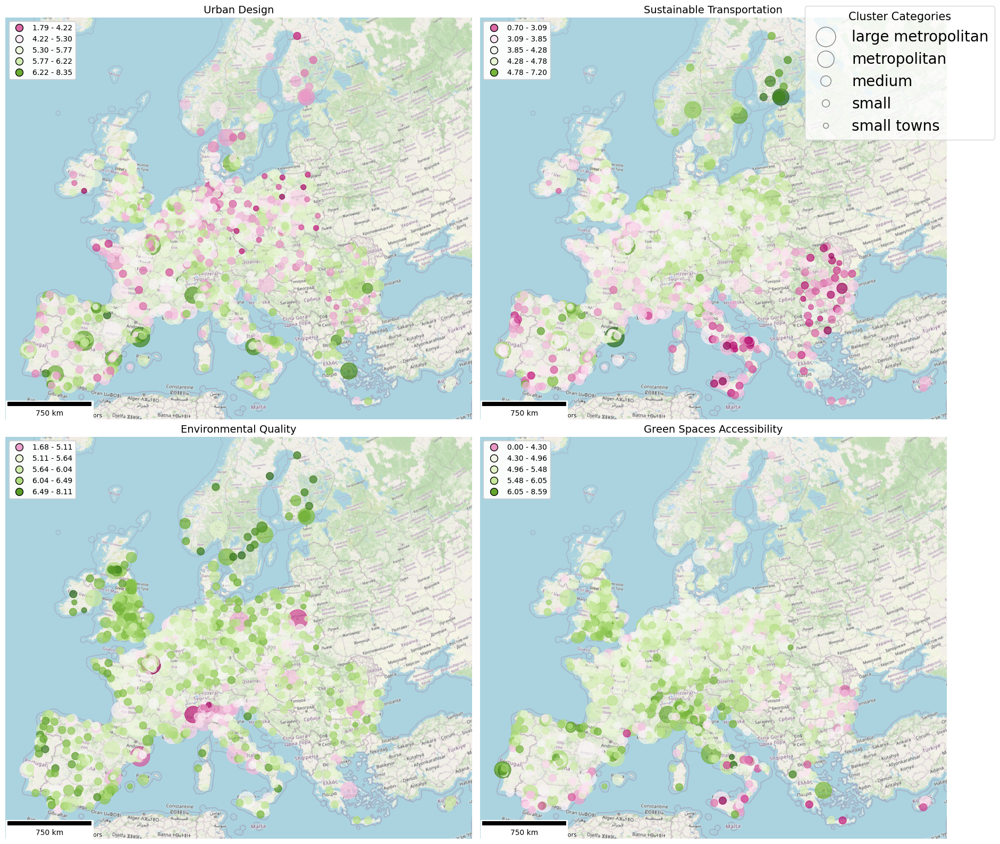

In [22]:
# Create a 2x2 subplot for the domains
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.flatten()

indicator_titles = domains  
# Create a copy of the GeoDataFrame
gdf_centroids = gdf_plot_qgis.copy()

shared_cmap = 'PiYG'  # optional diverging colormap
cmap = plt.cm.get_cmap(shared_cmap)


for ax, indicator in zip(axes, indicator_titles):
    # 1) Compute the quantiles for the current indicator (k=5 quantiles)
    data_series = gdf_centroids[indicator].dropna()
    quintiles = np.percentile(gdf_centroids[indicator].dropna(), [0, 20, 40, 60, 80, 100])

    # Normalize based on the full range
    norm = Normalize(vmin=quintiles[0], vmax=quintiles[-1])
    
    # Create a custom legend based on quintiles
    color_legend = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='none',
            markerfacecolor=cmap(norm((quintiles[i] + quintiles[i + 1]) / 2)),
            markersize=10,
            label=f"{quintiles[i]:.2f} - {quintiles[i + 1]:.2f}"
        ) for i in range(len(quintiles) - 1)
    ]
    
    # 3) Plot each cluster in the same subplot
    for cluster_name, props in cluster_dict.items():
        subset = gdf_centroids[gdf_centroids['cluster'] == cluster_name]
        subset.plot(
            ax=ax,
            column=indicator,
            cmap=shared_cmap,
            norm=norm,                   # use discrete bins
            markersize=props['markersize'],
            facecolor='none',            # hollow circle
            alpha=0.7,
            legend=False
        )

    ax.set_title(indicator, fontsize=14)
    ax.axis('off')

    # Add the quintile-based legend to the subplot
    legend = ax.legend(
        handles=color_legend,
        #title=title,
        loc='upper left',
        fontsize='medium',
        frameon=True
    )
    ax.add_artist(legend)

# ----------------------------------------------------------------
# Single figure-level legend for cluster categories (ring sizes)
# ----------------------------------------------------------------
legend_handles_clusters = []
for cluster_name, props in cluster_dict.items():
    legend_handles_clusters.append(
        Line2D(
            [0], [0],
            marker='o',
            color='grey',            # ring color
            markerfacecolor='none',  # hollow
            markersize=np.sqrt(props['markersize']),  # approximate
            linewidth=0,
            label=cluster_name
        )
    )

fig.legend(
    handles=legend_handles_clusters,
    title='Cluster Categories',
    loc='upper right',
    bbox_to_anchor=(1.05, 1),  # Move it well to the right
    fontsize=20,
    title_fontsize=15
)

# --------------------------------------------------------------
# Add basemap + scalebar to each subplot
# --------------------------------------------------------------
for ax in axes:
    ctx.add_basemap(
        ax,
        source=ctx.providers.OpenStreetMap.Mapnik,
        crs=gdf_centroids.crs
    )
    scalebar = ScaleBar(
        dx=1,
        units='m',
        dimension='si-length',
        scale_loc='bottom',
        location='lower left'
    )
    ax.add_artist(scalebar)

plt.tight_layout()
plt.savefig('plots/domains/geo_domains_quintiles2.png', bbox_inches='tight', pad_inches=0)
plt.show()
